## Punto a) 

In [89]:
#%% módulos y funciones a importar

from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import scipy

def func_ts3 (b, k, y1, y2):
        #%% Datos de la simulación      

        fs = 1000 # frecuencia de muestreo (Hz)
        N = 1000 # cantidad de muestras     

        # Datos del ADC
        B =  b# bits
        Vf = 2# rango simétrico de +/- Vf Volts
        vref = np.sqrt(2)
        q = (Vf)/(2**(B-1))# paso de cuantización de q Volts
        particiones = 2**B      

        # datos del ruido (potencia de la señal normalizada, es decir 1 W)
        pot_ruido_cuant = (q**2)/12# Watts 
        kn = k # escala de la potencia de ruido analógico
        pot_ruido_analog = pot_ruido_cuant * kn #       

        ts = 1/fs # tiempo de muestreo
        df = fs/N # resolución espectral        

        # Señales       

        def mi_funcion_sen (vmax, dc, f0, ph, N, fs):
            ts=1/fs
            df=fs/N
            nn = fs/f0

            tt = np.linspace(0, (N-1)*ts, N).flatten()      

            arg = (2*(np.pi)*f0*tt)     

            xx = dc + vmax*np.sin(arg + ph)

            return tt, xx       

        ff1 = 490#fs/N
        ff2 = 250
        ff3 = 249.5
        vmax = vref
        dc = 0
        ph = 0      

        # N: Número de muestras totales
        # nn: Número de muestras por ciclo
        # fs: Frecuencia de muestreo
        # f0: Frecuencia de la función a analizar
        # vmax: Voltaje máximo
        # dc: Voltaje acoplado en corriente continua
        # ph: Fase de la función a analizar     

        tt, xx = mi_funcion_sen( vmax, dc, ff1, ph, N, fs)
        tt2, xx2 = mi_funcion_sen( vmax, dc, ff2, ph, N, fs)
        tt3, xx3 = mi_funcion_sen( vmax, dc, ff3, ph, N, fs)        

        #%% Normalizo
        xn = xx/np.std(xx)      

        nn =  np.random.normal(0, np.sqrt(pot_ruido_analog), N) # señal de ruido de analógico       

        analog_sig = xn # señal analógica sin ruido
        analog_sig2 = xx2 # señal analógica sin ruido
        analog_sig3 = xx3 # señal analógica sin ruido       

        sr = analog_sig + nn # señal analógica de entrada al ADC (con ruido analógico)
        srq = np.round(sr/q)*q # señal cuantizada       

        nq =  srq - sr # señal de ruido de cuantización/ruido digital       



        #%% Visualización de resultados     

        # cierro ventanas anteriores
        plt.close('all')        

        ##################
        # Señal temporal
        ##################      

        plt.figure(1)       

        plt.figure(figsize=(20,10))
        plt.plot(tt, srq, lw=1, color='blue', markersize=5, markerfacecolor='blue', markeredgecolor='blue', fillstyle='none', label='ADC out (diezmada)')
        plt.plot(tt, sr, lw=1, color='green', marker='x', ls='dotted', label='ADC in')
        plt.plot(tt, analog_sig, lw=1, color='orange', ls='dotted', label='$ s $ (analog)')     

        plt.title('Señal muestreada por un ADC de {:d} bits - $\pm V_R= $ {:3.1f} V - q = {:3.3f} V'.format(B, Vf, q) )
        plt.xlabel('tiempo [segundos]')
        plt.ylabel('Amplitud [V]')
        axes_hdl = plt.gca()
        axes_hdl.legend()
        plt.show()      

        ###########
        # Espectro
        ###########     

        plt.figure(2)
        
        plt.figure(figsize=(20,10))

        ft_SR = 1/N*np.fft.fft( sr)
        ft_Srq = 1/N*np.fft.fft( srq)
        ft_As = 1/N*np.fft.fft( xn)
        ft_Nq = 1/N*np.fft.fft( nq)
        ft_Nn = 1/N*np.fft.fft( nn)     

        # grilla de sampleo frecuencial
        ff = np.linspace(0, (N-1)*df, N)        

        bfrec = ff <= fs/2      

        Nnq_mean = np.mean(np.abs(ft_Nq)**2)
        nNn_mean = np.mean(np.abs(ft_Nn)**2)        

        plt.plot( ff[bfrec], 10* np.log10(2*np.abs(ft_As[bfrec])**2), color='blue', label='$ s $ (sig.)', marker = 'x' )        

        plt.plot( np.array([ ff[bfrec][0], ff[bfrec][-1] ]), 10* np.log10(2* np.array([nNn_mean, nNn_mean]) ), '--r', label= '$ \overline{n} = $' + '{:3.1f} dB'.format(10* np.log10(2* nNn_mean)) )
        plt.plot( ff[bfrec], 10* np.log10(2*np.abs(ft_SR[bfrec])**2), ':g', label='$ s_R = s + n $' )
        plt.plot( ff[bfrec], 10* np.log10(2*np.abs(ft_Srq[bfrec])**2), lw=2, label='$ s_Q = Q_{B,V_F}\{s_R\}$' )
        plt.plot( np.array([ ff[bfrec][0], ff[bfrec][-1] ]), 10* np.log10(2* np.array([Nnq_mean, Nnq_mean]) ), '--c', label='$ \overline{n_Q} = $' + '{:3.1f} dB'.format(10* np.log10(2* Nnq_mean)) )
        plt.plot( ff[bfrec], 10* np.log10(2*np.abs(ft_Nn[bfrec])**2), ':r')
        plt.plot( ff[bfrec], 10* np.log10(2*np.abs(ft_Nq[bfrec])**2), ':c')
        plt.plot( np.array([ ff[bfrec][-1], ff[bfrec][-1] ]), plt.ylim(), ':k', label='BW', lw = 0.5  )     

        plt.title('Señal muestreada por un ADC de {:d} bits - $\pm V_R= $ {:3.1f} V - q = {:3.3f} V'.format(B, Vf, q) )
        plt.ylabel('Densidad de Potencia [dB]')
        plt.xlabel('Frecuencia [Hz]')
        axes_hdl = plt.gca()
        axes_hdl.legend()       

        plt.ylim([y1, y2])

        #############
        # Histograma
        #############       

        plt.figure(3)

        plt.figure(figsize=(10,10))

        bins = 10
        plt.hist(nq.flatten()/(q), bins=bins)
        plt.plot( np.array([-1/2, -1/2, 1/2, 1/2]), np.array([0, N/bins, N/bins, 0]), '--r' )
        plt.title( 'Ruido de cuantización para {:d} bits - $\pm V_R= $ {:3.1f} V - q = {:3.3f} V'.format(B, Vf, q))     

        plt.xlabel('Pasos de cuantización (q) [V]')  

<Figure size 640x480 with 0 Axes>

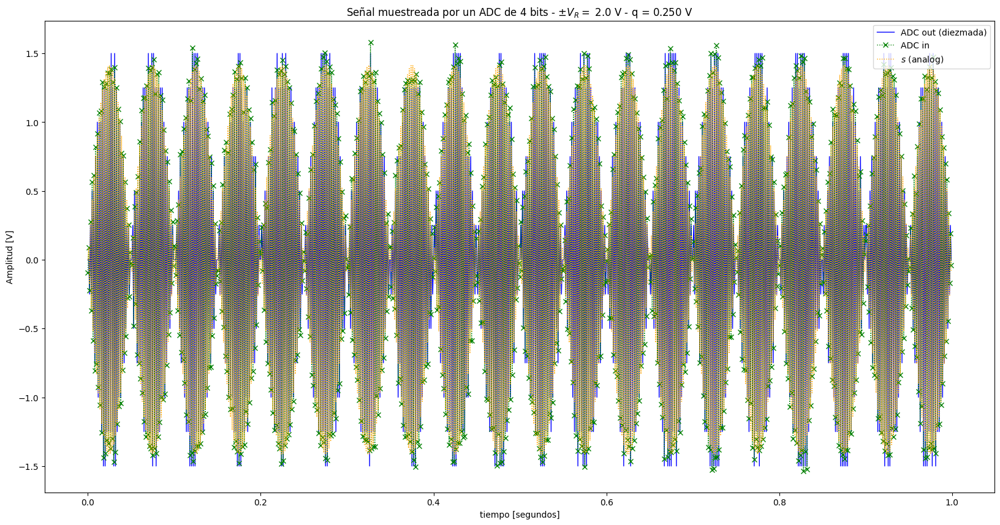

<Figure size 640x480 with 0 Axes>

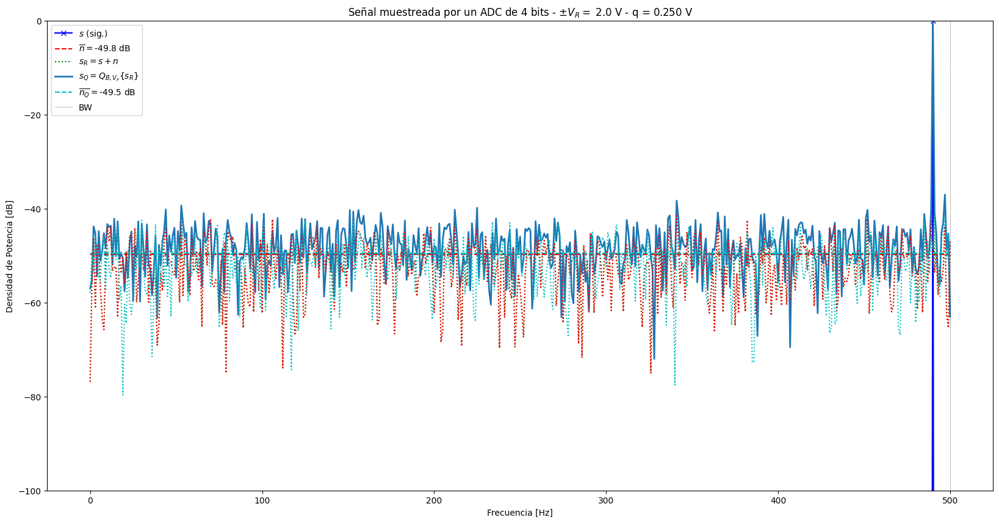

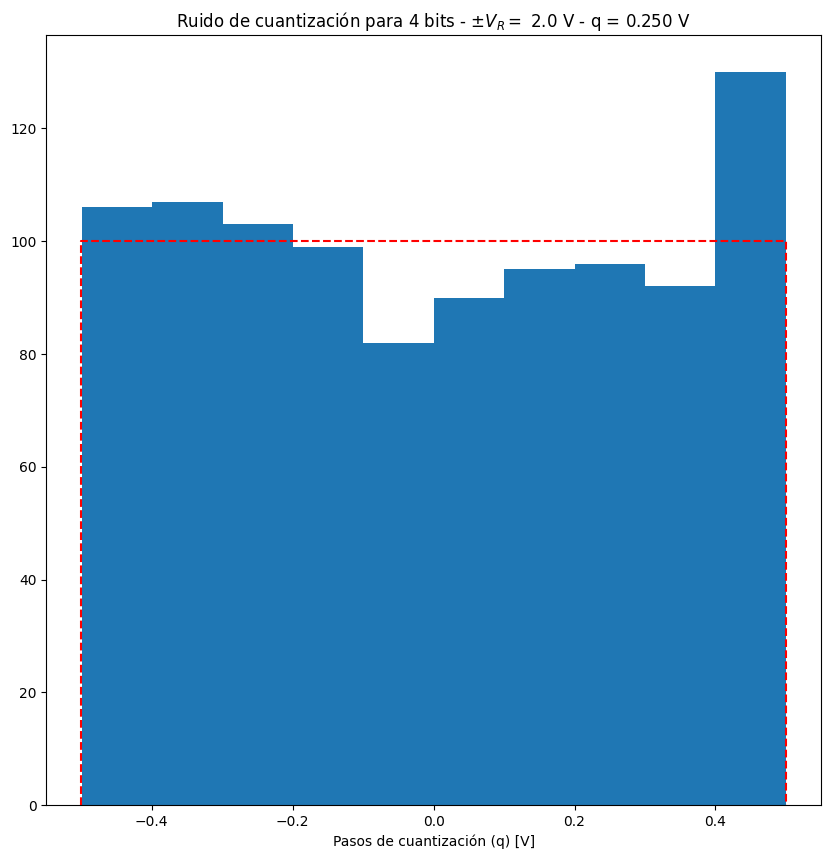

In [90]:
func_ts3(4, 1, -100, 0)  

## Punto b)

<Figure size 640x480 with 0 Axes>

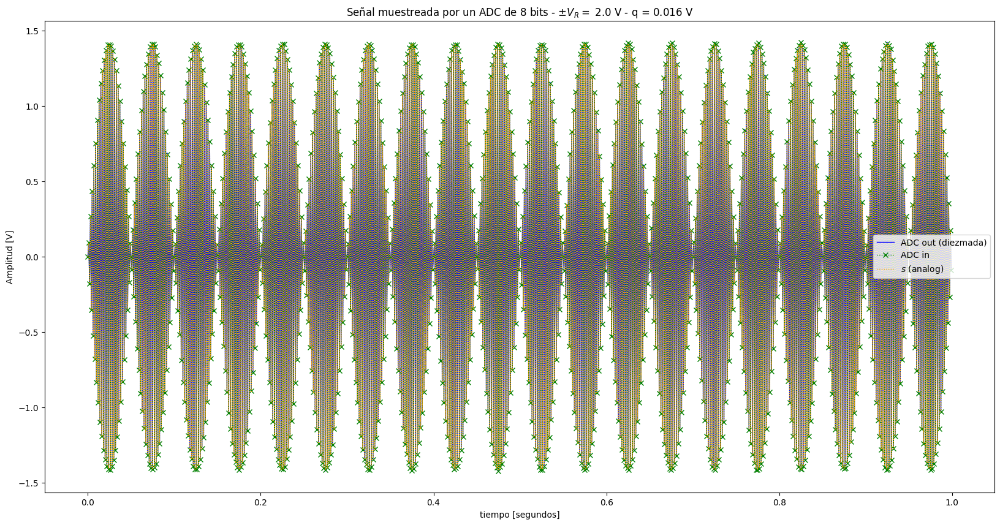

<Figure size 640x480 with 0 Axes>

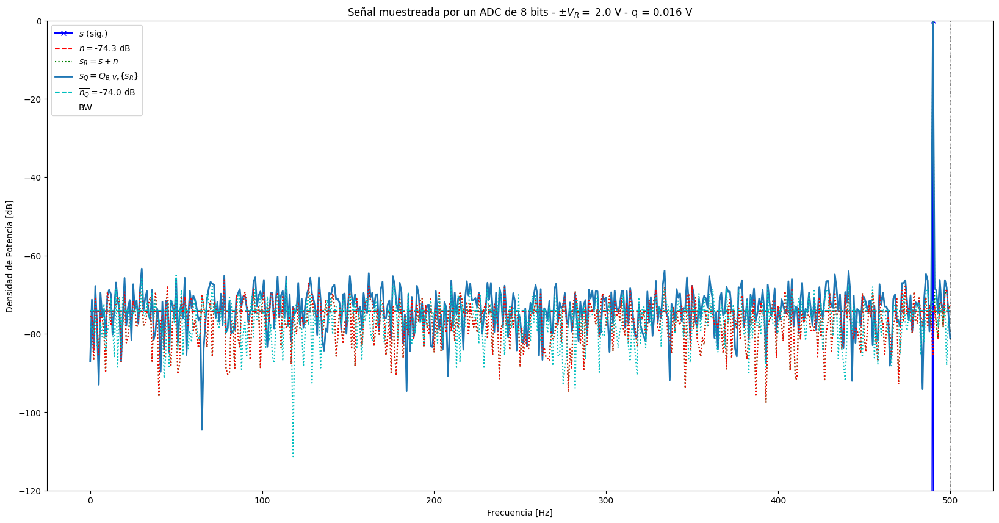

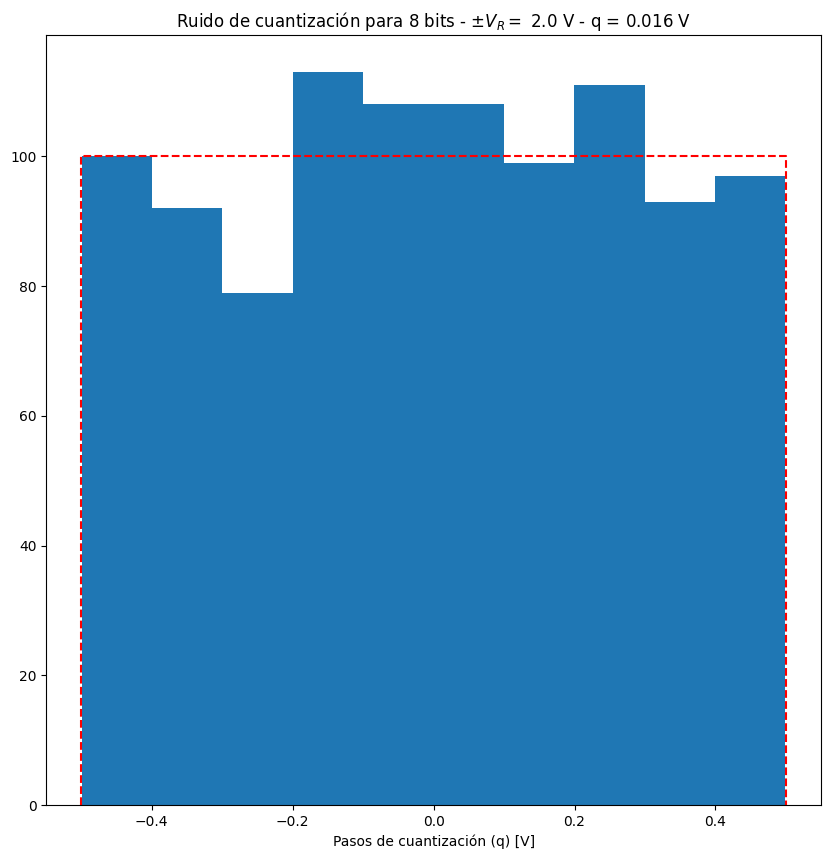

In [91]:
func_ts3(8, 1, -120, -0)  

<Figure size 640x480 with 0 Axes>

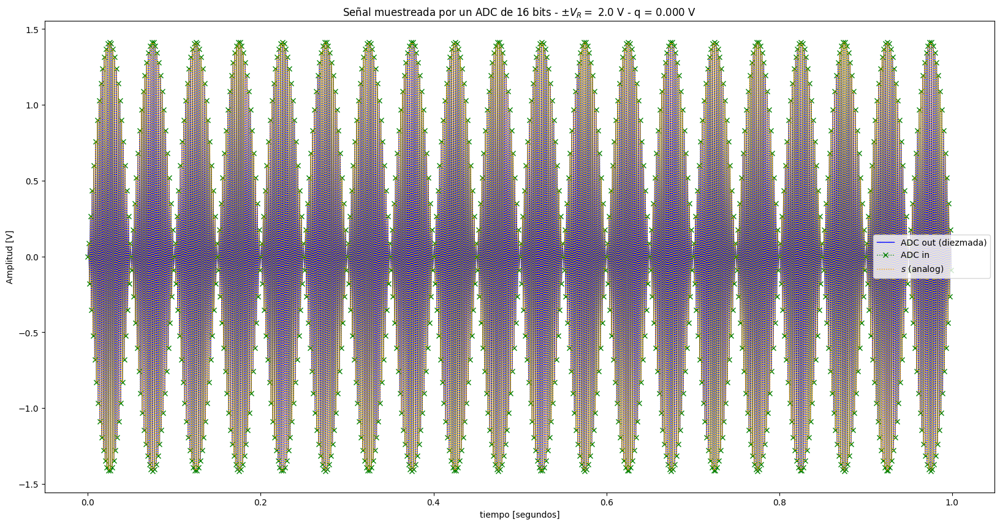

<Figure size 640x480 with 0 Axes>

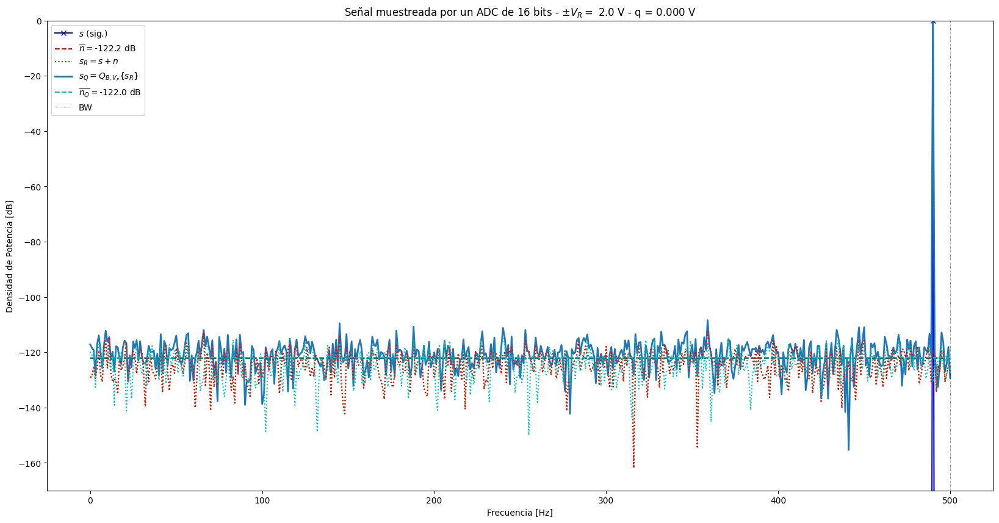

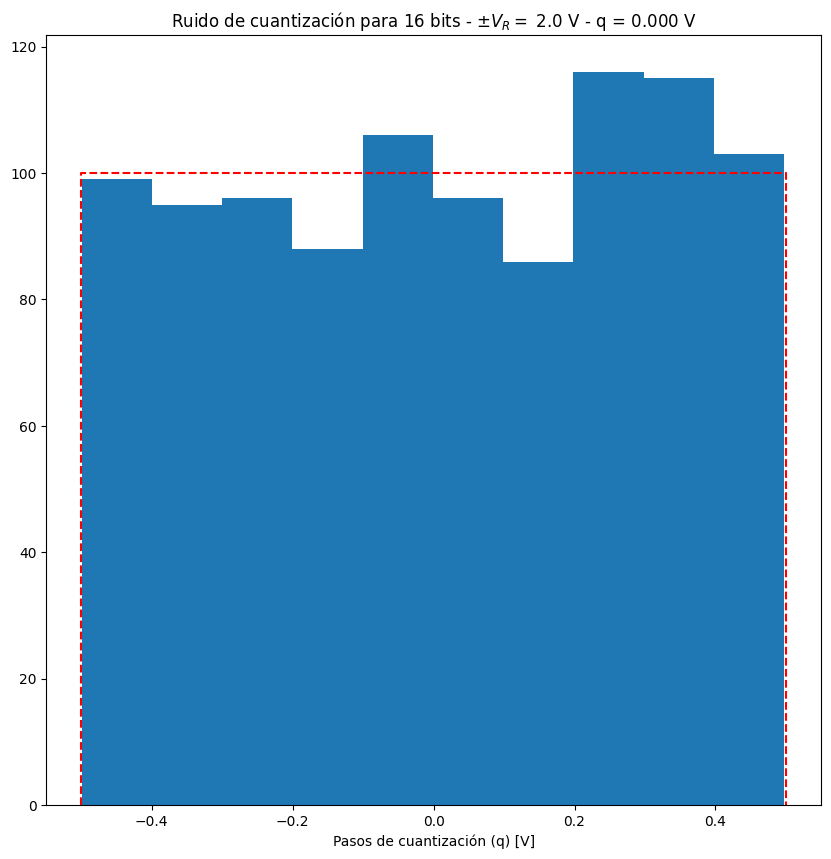

In [92]:
func_ts3(16, 1, -170, 0)   

<Figure size 640x480 with 0 Axes>

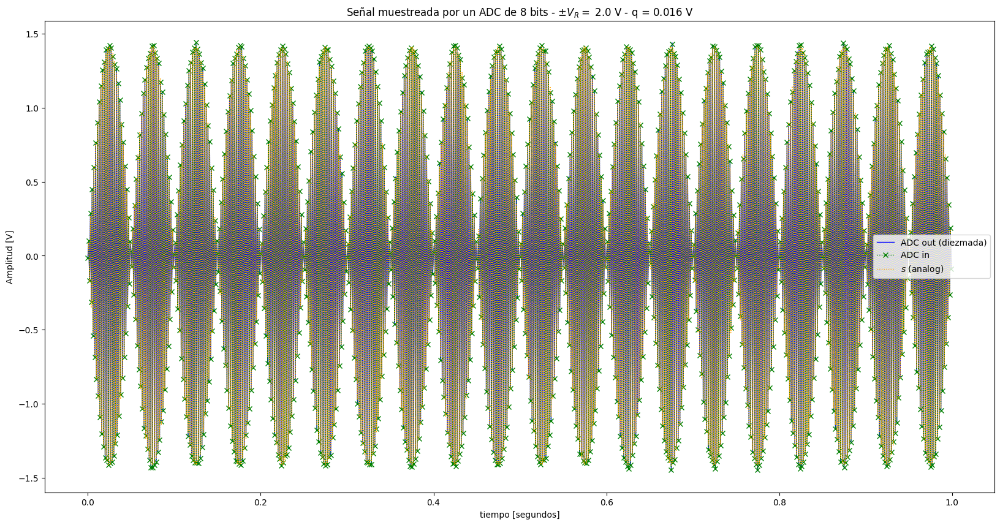

<Figure size 640x480 with 0 Axes>

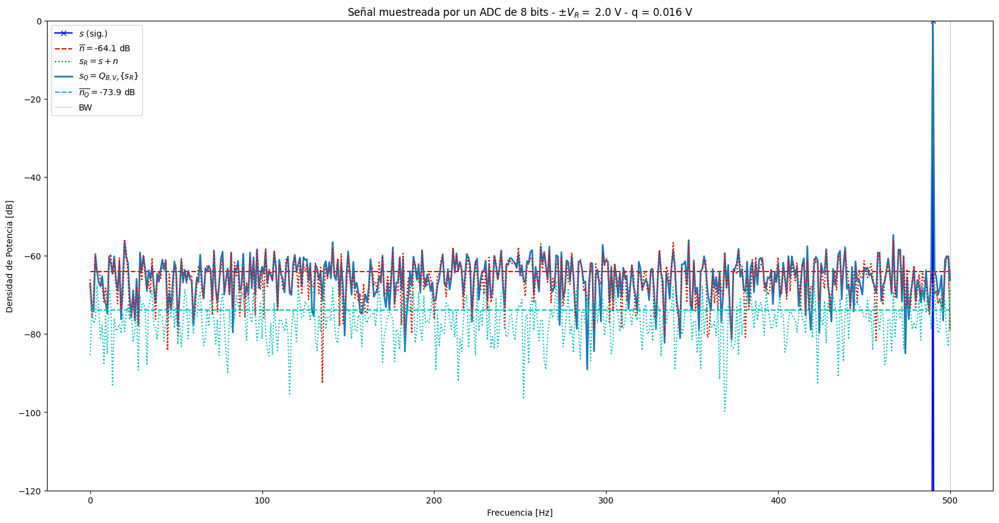

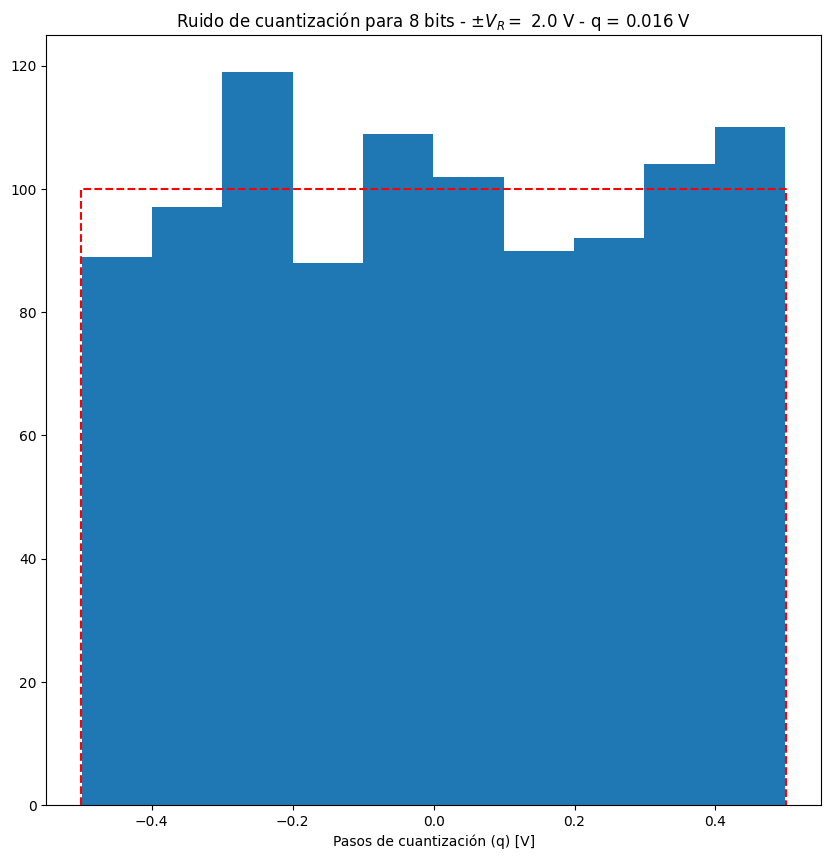

In [93]:
func_ts3(8, 10, -120, 0)

<Figure size 640x480 with 0 Axes>

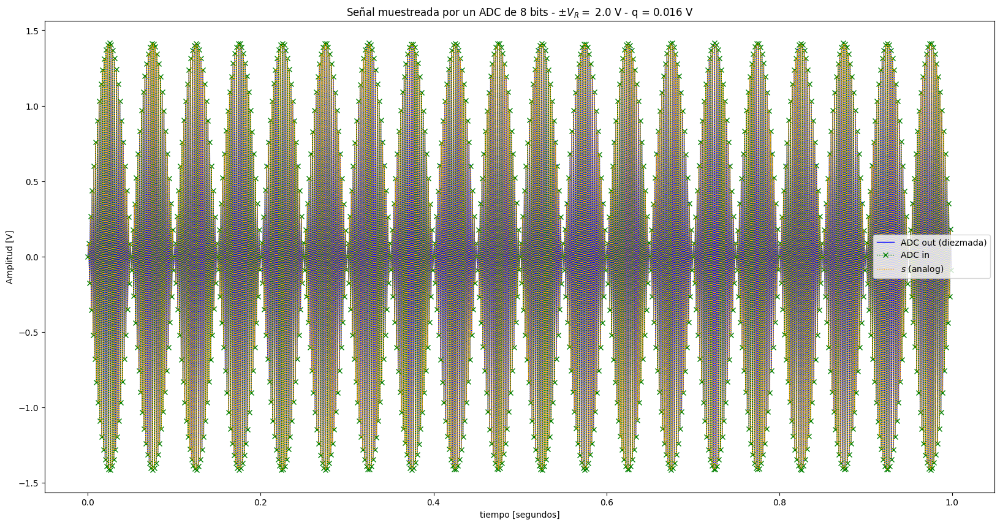

<Figure size 640x480 with 0 Axes>

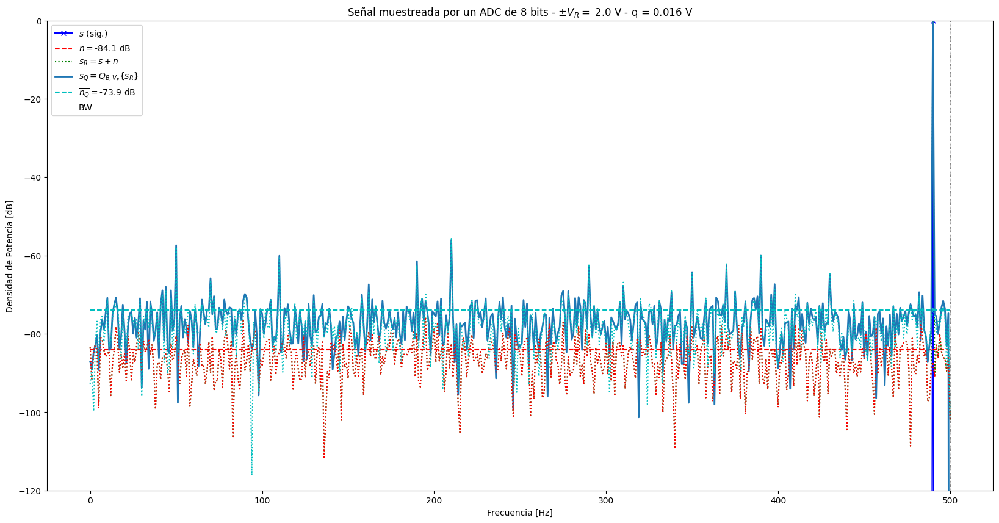

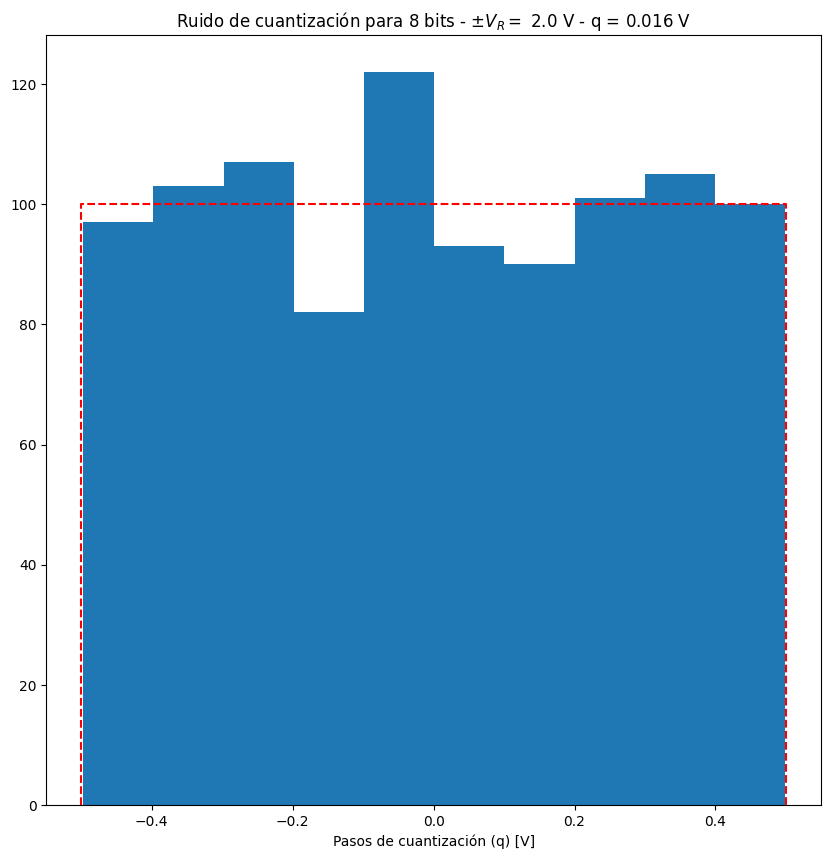

In [94]:
func_ts3(8, 1/10, -120, 0)

En base a los gráficos presentados, es posible apreciar cómo al variar el número de bits del ADC y dejar fijo el ruido análógo, la correlación entre la señal que retorna el mismo tiene menos correlación con la señal original. Además, desde el punto de vista de los espectros, lo pisos de ruido se desplazan en concordancia, sienda más chicos mientras mayor sea el número de bits. Sin embargo, la diferencia entre el piso de ruido digital y el analógico no percibe cambios grandes al modificar este valor.
Por su parte, si se varía el ruido de la señal análógica, la diferencia importante se percibe en los pisos de ruidos; donde, con un factor de 1/10 el piso de ruido analógico se posiciona unos 10 dB por debajo del piso digital y, con un kp de 10, el mismo adquiere un valor aprocimadamente 10 dB con respecto al piso de ruido digital.

## Bonus 1

En la siguiente ecuación se ve cómo quedaría definida la señal cuantizada:

$$ \hat{x}[n] = x[n] + e[n] $$

Donde e[n] es el error que agrega la cuantización a mi "señal limpia" x[n].
Así, el conversor empleado porcionará en "niveles de cuantización" el rango de referencia que posea o se le propocione, en nuestro caso, 2 V. Esta partición estará determinada por la cantidad de bits del ADC; mientras mayor sea este, menos error presentará la cuantización.

Luego, según sea la frecuencia de muestreo del conversor, el mismo tomará mediciones de la señal en esos puntos determinados por la frecuencia mencionada. Estas, estarán luegos sopesadas por el mismo ADC y hará un redondeo, colocando ese valor concreto en la parte más alta o más baja del cuanto en el que se encuentre. Este redondeo generalmente se hace por proximidad de valores pero, dependiendo el ADC, podría variar. Es decir, la medición real se econtrará entre $-\Delta V/2$ y + $\Delta V/2$, donde $\Delta V$ es el tamaño de cada nivel de cuantización.

Para calcular la potencia del ruido, que será dada por este error e[n], se emplea:

$$ \sigma^{2}_{e} = \int_{-\Delta V/2}^{\Delta V/2} e^{2} p_{e}de = \frac{\Delta V^2}{12}$$

Esta ecuación, para un conversor de N-bits y un Voltaje de escala complpeta $V_{FS}$, queda expresada como:

$$ \sigma^{2}_{e} = \frac{\Delta V^2}{12} = \frac{V^{2}_{FS}}{12 * 2^{2N}}$$

Finalmente, la potencia en decibeles de la relacion señal a ruido se define como:

$$SNR \overset{\underset{\mathrm{def}}{}}{=} 10 log_{10} \frac{\sigma^{2}_x}{\sigma^{2}_{e}} = 10 log_{10} \frac{12 * 2^{2N} \sigma^{2}_x}{V^{2}_{FS}} = 6,02N + 10,79 + 20 log_{10} \frac{\sigma_x}{V_{FS}}$$

## Bonus 2

In [95]:
#%% módulos y funciones a importar

from scipy import signal
import numpy as np
import matplotlib.pyplot as plt
import scipy

def func_ts3_b (b, k, x1, x2, fff):
        #%% Datos de la simulación      
        fs = 1000
        fs2 = 18000 # frecuencia de muestreo (Hz)
        N = 1000 # cantidad de muestras     

        # Datos del ADC
        B =  b# bits
        Vf = 2# rango simétrico de +/- Vf Volts
        vref = np.sqrt(2)/2
        q = (Vf)/(2**(B-1))# paso de cuantización de q Volts
        particiones = 2**B      

        # datos del ruido (potencia de la señal normalizada, es decir 1 W)
        pot_ruido_cuant = (q**2)/12# Watts 
        kn = 1/10 # escala de la potencia de ruido analógico
        pot_ruido_analog = pot_ruido_cuant * kn #      

        fs = 1000 # frecuencia de muestreo (Hz)
        N = 1000 # cantidad de muestras   
        fs2 = 18000
        N2 = 18000    
        ts = 1/fs # tiempo de muestreo
        ts2 = 1/fs2
        df = fs/N # resolución espectral   

        def mi_funcion_sen (vmax, dc, f0, ph, N, fs):
            ts=1/fs # tiempo de muestreo
            df=fs/N # resolución espectral
            nn = fs/f0

            tt = np.linspace(0, (N-1)*ts, N).flatten()      

            arg = (2*(np.pi)*f0*tt)     

            xx = dc + vmax*np.sin(arg + ph)

            return tt, xx     
          
        def mi_funcion_sen2 (vmax, dc, f0, ph, N, fs):
            ts=1/fs
            df=fs/N
            nn = fs/f0

            tt = np.linspace(0, (N-1)*ts, N).flatten()      

            arg = (2*(np.pi)*f0*tt)     

            xx = dc + vmax*np.sin(arg + ph)

            return tt, xx  

        ff1 = fff #fs/N
        ff2 = fff
        vmax = vref
        dc = 0
        ph = 0      

        # N: Número de muestras totales
        # nn: Número de muestras por ciclo
        # fs: Frecuencia de muestreo
        # f0: Frecuencia de la función a analizar
        # vmax: Voltaje máximo
        # dc: Voltaje acoplado en corriente continua
        # ph: Fase de la función a analizar     

        tt, xx = mi_funcion_sen( vmax, dc, ff1, ph, N, fs)
        tt2, xx2 = mi_funcion_sen2( vmax, dc, ff2, ph, N2, fs2)

        #%% Normalizo
        xn = xx/np.std(xx)      
        xn2 = xx2/np.std(xx2)      

        nn =  np.random.normal(0, np.sqrt(pot_ruido_analog), N) # señal de ruido de analógico       

        analog_sig = xn # señal analógica sin ruido
        analog_sig2 = xn2 # señal analógica sin ruido 

        sr = analog_sig + nn # señal analógica de entrada al ADC (con ruido analógico)
        srq = np.round(sr/q)*q # señal cuantizada       

        nq =  srq - sr # señal de ruido de cuantización/ruido digital       

        #%% Visualización de resultados     

        # cierro ventanas anteriores
        plt.close('all')        

        ##################
        # Señal temporal
        ##################      

        plt.figure(1)       

        plt.figure(figsize=(20,10))
        plt.plot(tt, srq, lw=1, color='blue', markersize=5, markerfacecolor='blue', markeredgecolor='blue', fillstyle='none', label='ADC out (diezmada)')
        plt.plot(tt, sr, lw=1, color='green', marker='x', ls='dotted', label='ADC in')
        plt.plot(tt, analog_sig, lw=1, color='orange', label='$ s $ (analog)')
        plt.plot(tt2, analog_sig2, lw=1, color='blue', ls='dotted', label='Respuesta esperada')     
     

        plt.title('Señal muestreada por un ADC de {:d} bits - $\pm V_R= $ {:3.1f} V - q = {:3.3f} V'.format(B, Vf, q) )
        plt.xlabel('tiempo [segundos]')
        plt.ylabel('Amplitud [V]')
        axes_hdl = plt.gca()
        axes_hdl.legend()
        plt.xlim([x1, x2])
        plt.show()

<Figure size 640x480 with 0 Axes>

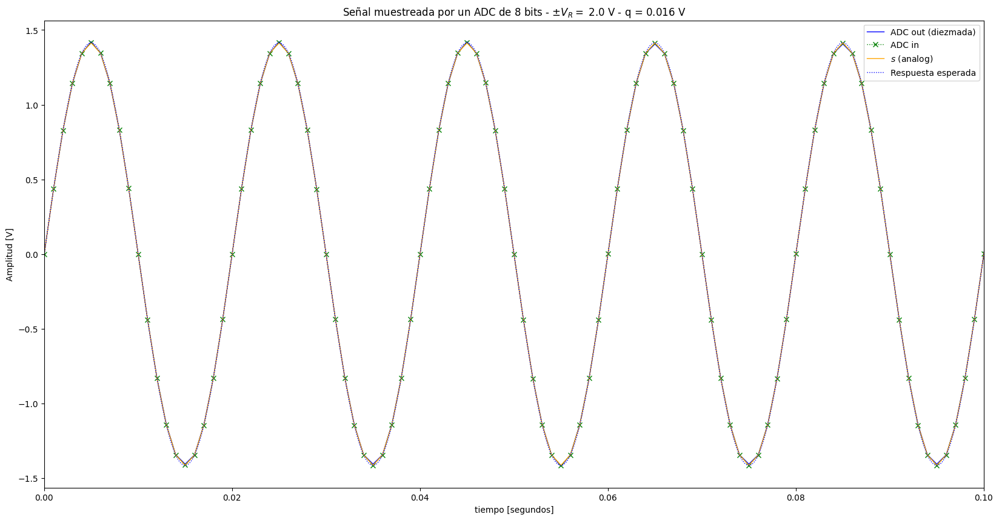

<Figure size 640x480 with 0 Axes>

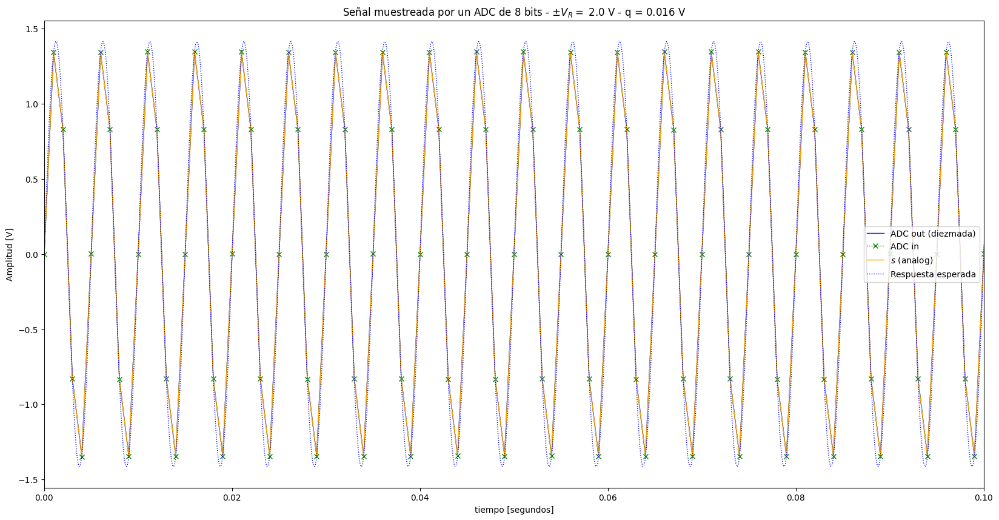

<Figure size 640x480 with 0 Axes>

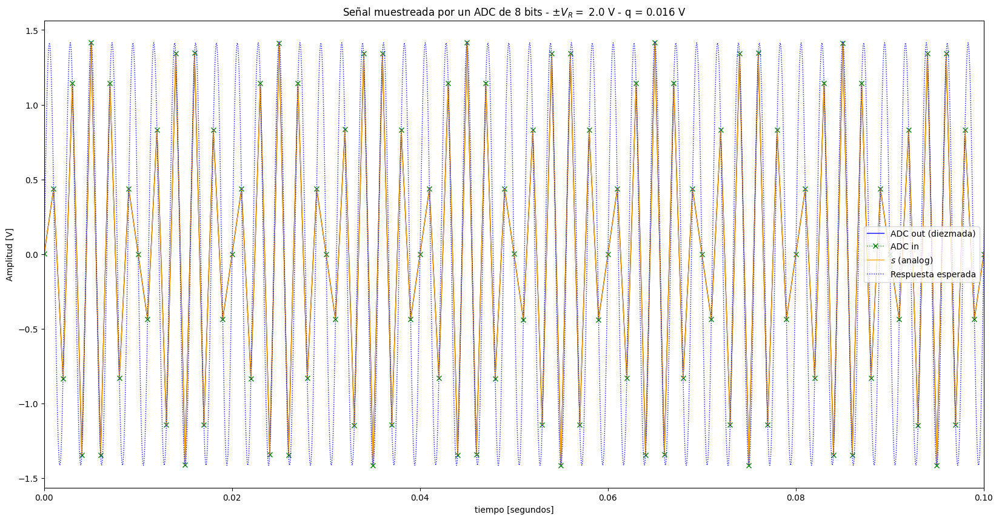

<Figure size 640x480 with 0 Axes>

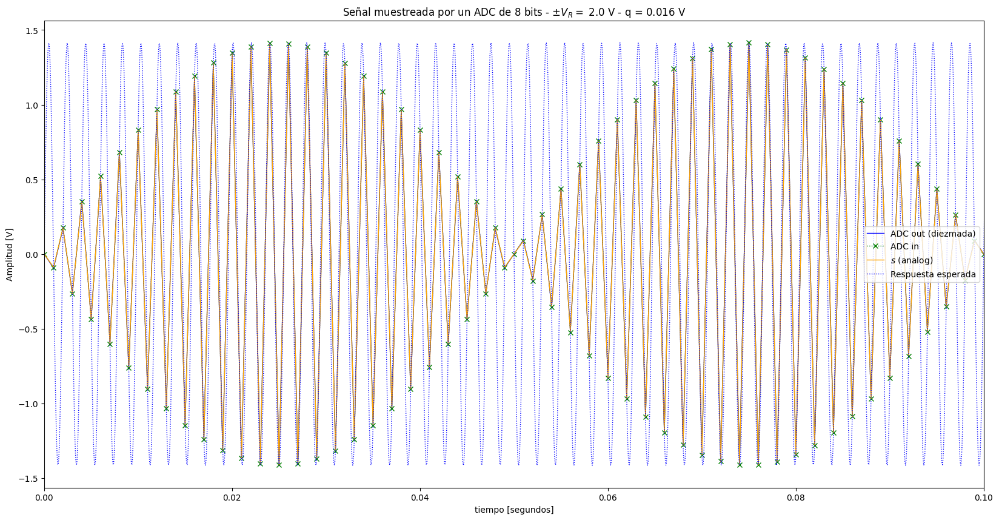

In [96]:
func_ts3_b (8, 1, 0, 0.1, 50)
func_ts3_b (8, 1, 0, 0.1, 200)
func_ts3_b (8, 1, 0, 0.1, 450)
func_ts3_b (8, 1, 0, 0.1, 510)

Se puede observar cómo para distintas frecuencias, mientras más se acerca a la frecuencia de Nyquist, en este caso 500 Hz, la señal (naranja), se aleja cada vez más del valor real que debería tener (azul).